In [1]:
# Importing libraries
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly.graph_objects as go


from IPython.display import Markdown as md

import indicators
import featureCreator

import yfinance as yf

In [2]:
# Reading the historical data from yfinance library
ticker = 'GOOGL'
Ticker = yf.Ticker(ticker)
df = Ticker.history(period='max')

In [3]:
df

,Open,High,Low,Close,Volume,Dividends,Stock Splits
Date,,,,,,,
2004-08-19,50.05,52.08,48.03,50.22,44659096,0,0.0
2004-08-20,50.56,54.59,50.30,54.21,22834343,0,0.0
2004-08-23,55.43,56.80,54.58,54.75,18256126,0,0.0
2004-08-24,55.68,55.86,51.84,52.49,15247337,0,0.0
2004-08-25,52.53,54.05,51.99,53.05,9188602,0,0.0
...,...,...,...,...,...,...,...
2021-04-05,2147.15,2228.99,2145.21,2218.96,2425500,0,0.0
2021-04-06,2210.92,2228.00,2201.79,2209.26,1762000,0,0.0
2021-04-07,2213.10,2244.50,2213.10,2239.03,1206700,0,0.0


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 4189 entries, 2004-08-19 to 2021-04-09
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Open          4189 non-null   float64
 1   High          4189 non-null   float64
 2   Low           4189 non-null   float64
 3   Close         4189 non-null   float64
 4   Volume        4189 non-null   int64  
 5   Dividends     4189 non-null   int64  
 6   Stock Splits  4189 non-null   float64
dtypes: float64(5), int64(2)
memory usage: 261.8 KB


# Data Cleaning Process

> Change the Stock Splits column name for ease of use

In [5]:
df.rename(columns={'Stock Splits':'stockSplits'}, inplace=True)

In [6]:
# Check column names
df.columns

Index(['Open', 'High', 'Low', 'Close', 'Volume', 'Dividends', 'stockSplits'], dtype='object')

> Replace 0 values in dividends and stock_splits column to NaN

In [7]:
df.Dividends.replace(0.0, np.nan, inplace=True)

In [8]:
df.stockSplits.replace(0.0, np.nan, inplace=True)

In [9]:
# Check null values for dividends column
df.Dividends.notnull().sum()

4189

In [10]:
# Check null values for stock_splits column
df.stockSplits.notnull().sum()

1

> Since this ticker (GOOGL) doesn't have any dividends, we can drop this column

In [11]:
df.drop(['Dividends'], axis=1, inplace=True)

In [12]:
# Check the only row that has stock_splits value and the rows nearby 
df.loc['2014-04-01':'2014-04-07']

,Open,High,Low,Close,Volume,stockSplits
Date,,,,,,
2014-04-01,560.70,569.32,559.56,568.01,4357638,NaN
2014-04-02,571.52,572.97,562.56,568.12,4168028,NaN
2014-04-03,573.39,588.30,566.01,571.50,4018300,1.998
2014-04-04,578.55,579.72,544.49,545.25,5363700,NaN
2014-04-07,544.79,549.85,530.53,540.63,3961600,NaN


In [13]:
# Store the date that stock splits
split_date = '2014-04-03'

## Same DataFrames with different time frame

- Making DataFrames with weekly, monthly, quarterly, and yearly time frames

In [14]:
dfWeekly = featureCreator.changePeriod(df, period='W')
dfWeekly

,Close,Open,Low,High,Volume,stockSplits
Date,,,,,,
2004-08-22,54.21,50.05,48.03,54.59,67493439,0.0
2004-08-29,53.13,55.43,51.84,56.80,55998745,0.0
2004-09-05,50.06,52.69,49.52,52.80,39524036,0.0
2004-09-12,52.72,50.56,49.85,53.33,23593782,0.0
2004-09-19,58.80,53.37,53.28,58.80,48125026,0.0
...,...,...,...,...,...,...
2021-03-14,2050.00,2084.06,2005.19,2113.74,7963300,0.0
2021-03-21,2026.96,2044.98,2002.93,2113.68,8081300,0.0
2021-03-28,2024.73,2027.63,1996.09,2067.60,7542300,0.0


In [15]:
dfMonthly = featureCreator.changePeriod(df, period='M')
dfMonthly

,Close,Open,Low,High,Volume,stockSplits
Date,,,,,,
2004-08-31,51.24,50.05,48.03,56.80,133606859,0.0
2004-09-30,64.86,51.40,49.52,67.58,212495690,0.0
2004-10-31,95.42,65.47,64.51,100.08,513621664,0.0
2004-11-30,91.08,96.87,80.74,100.90,554633012,0.0
2004-12-31,96.49,91.07,84.32,100.04,290393915,0.0
...,...,...,...,...,...,...
2020-12-31,1752.64,1766.66,1694.00,1843.83,30432800,0.0
2021-01-31,1827.36,1760.00,1696.10,1932.08,39583900,0.0
2021-02-28,2021.91,1844.59,1844.59,2145.14,33908200,0.0


In [16]:
dfQuarterly = featureCreator.changePeriod(df, period='3M')
dfQuarterly

,Close,Open,Low,High,Volume,stockSplits
Date,,,,,,
2004-08-31,51.24,50.05,48.03,56.80,133606859,0.0
2004-11-30,91.08,51.40,49.52,100.90,1280750366,0.0
2005-02-28,94.09,91.07,84.32,108.51,1350881766,0.0
2005-05-31,138.77,94.74,86.37,139.34,1303512983,0.0
2005-08-31,143.14,141.74,133.85,159.06,1472371552,0.0
...,...,...,...,...,...,...
2020-05-31,1433.52,1351.39,1008.87,1445.11,171008100,0.0
2020-08-31,1629.53,1425.70,1351.65,1652.79,112594300,0.0
2020-11-30,1754.40,1632.16,1402.15,1816.89,116175000,0.0


In [17]:
dfYearly = featureCreator.changePeriod(df, period='Y')
dfYearly


,Close,Open,Low,High,Volume,stockSplits
Date,,,,,,
2004-12-31,96.49,50.05,48.03,100.90,1704751140,0.000
2005-12-31,207.64,98.80,86.37,223.33,5381952254,0.000
2006-12-31,230.47,211.47,165.94,256.76,4258992349,0.000
2007-12-31,346.09,233.23,218.72,373.99,2727653226,0.000
2008-12-31,153.98,346.78,123.77,349.03,3195536067,0.000
2009-12-31,310.30,154.45,141.52,313.31,1766847188,0.000
2010-12-31,297.28,313.79,217.03,315.74,1601069528,0.000
2011-12-31,323.27,298.54,236.75,323.70,1549871372,0.000
2012-12-31,354.04,326.80,278.54,387.58,1300885218,0.000


## Feature Extraction

- Adding some basic features based on Open, High, Close, Low, and Volume columns
- Adding some indicators with different time frames

### Basic features

In [18]:
def basicFeatures(data: pd.DataFrame) -> pd.DataFrame:
    data['gapValue'] = featureCreator.findGapsValue(data)
    data['gapPercentage'] = featureCreator.findGapsPercentage(data)
    data['valueReturn'] = featureCreator.valueReturn(data)
    data['valueReturnPercentage'] = featureCreator.valueReturnPercentage(data)
    data['termReturnValue'] = featureCreator.termReturnValue(data)
    data['termReturnPercentage'] = featureCreator.termReturnPercentage(data)
    data['volumeInDollars'] = featureCreator.volumeCalculatorToDollars(data)
    # data['marketCap'] = feature Creator.capCalculator(data)
    
    data['originalFluctuationPercentage'] = featureCreator.originalFluctuationPercentage(data)
    data['originalFluctuationValue'] = featureCreator.originalFluctuationValue(data)
    data['wholeFluctuationPercentage'] = featureCreator.wholeFluctuationPercentage(data)
    data['wholeFluctuationValue'] = featureCreator.wholeFluctuationValue(data)
    data['shadowFluctuationPercentage'] = featureCreator.shadowFluctuationPercentage(data)
    data['shadowFluctuationValue'] = featureCreator.shadowFluctuationValue(data)
    
    return data


def basicIndicators(data: pd.DataFrame) -> pd.DataFrame:
    data['SMA5'] = indicators.SMA(data, period=5)
    data['SMA15'] = indicators.SMA(data, period=15)
    data['SMA50'] = indicators.SMA(data, period=50)
    data['SMA100'] = indicators.SMA(data, period=100)
    data['SMA200'] = indicators.SMA(data, period=200)

    data['EMA5'] = indicators.EMA(data, period=5)
    data['EMA15'] = indicators.EMA(data, period=15)
    data['EMA50'] = indicators.EMA(data, period=50)
    data['EMA100'] = indicators.EMA(data, period=100)
    data['EMA200'] = indicators.EMA(data, period=200)

    data['RSI'] = indicators.RSI(data)
    data['OBV'] = indicators.OBV(data)

    data['MACD'], data['Signal'] = indicators.MACD(data)
    data['PK'], data['PD'] = indicators.StochasticOscillator(data)
    
    return data

In [19]:
df = basicFeatures(df)
dfWeekly = basicFeatures(dfWeekly)
dfMonthly = basicFeatures(dfMonthly)
dfQuarterly = basicFeatures(dfQuarterly)
dfYearly = basicFeatures(dfYearly)

In [20]:
df

,Open,High,Low,Close,Volume,stockSplits,gapValue,gapPercentage,valueReturn,valueReturnPercentage,termReturnValue,termReturnPercentage,volumeInDollars,originalFluctuationPercentage,originalFluctuationValue,wholeFluctuationPercentage,wholeFluctuationValue,shadowFluctuationPercentage,shadowFluctuationValue
Date,,,,,,,,,,,,,,,,,,,
2004-08-19,50.05,52.08,48.03,50.22,44659096,NaN,NaN,NaN,NaN,NaN,0.17,0.339660,2.242780e+09,0.339660,0.17,8.091908,4.05,7.752248,3.88
2004-08-20,50.56,54.59,50.30,54.21,22834343,NaN,0.34,0.677021,3.99,7.945042,3.65,7.219146,1.237850e+09,7.219146,3.65,8.484968,4.29,1.265823,0.64
2004-08-23,55.43,56.80,54.58,54.75,18256126,NaN,1.22,2.250507,0.54,0.996126,-0.68,-1.226773,9.995229e+08,1.226773,0.68,4.005051,2.22,2.778279,1.54
2004-08-24,55.68,55.86,51.84,52.49,15247337,NaN,0.93,1.698630,-2.26,-4.127854,-3.19,-5.729167,8.003327e+08,5.729167,3.19,7.219828,4.02,1.490661,0.83
2004-08-25,52.53,54.05,51.99,53.05,9188602,NaN,0.04,0.076205,0.56,1.066870,0.52,0.989911,4.874553e+08,0.989911,0.52,3.921569,2.06,2.931658,1.54
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-04-05,2147.15,2228.99,2145.21,2218.96,2425500,NaN,17.37,0.815577,89.18,4.187287,71.81,3.344433,5.382087e+09,3.344433,71.81,3.901916,83.78,0.557483,11.97
2021-04-06,2210.92,2228.00,2201.79,2209.26,1762000,NaN,-8.04,-0.362332,-9.70,-0.437142,-1.66,-0.075082,3.892716e+09,0.075082,1.66,1.185479,26.21,1.110397,24.55
2021-04-07,2213.10,2244.50,2213.10,2239.03,1206700,NaN,3.84,0.173814,29.77,1.347510,25.93,1.171660,2.701838e+09,1.171660,25.93,1.418824,31.40,0.247165,5.47


### Indicators

In [21]:
df = basicIndicators(df)
dfWeekly = basicIndicators(dfWeekly)
dfMonthly = basicIndicators(dfMonthly)
dfQuarterly = basicIndicators(dfQuarterly)
dfYearly = basicIndicators(dfYearly)

In [22]:
df

,Open,High,Low,Close,Volume,stockSplits,gapValue,gapPercentage,valueReturn,valueReturnPercentage,...,EMA15,EMA50,EMA100,EMA200,RSI,OBV,MACD,Signal,PK,PD
Date,,,,,,,,,,,,,,,,,,,,,
2004-08-19,50.05,52.08,48.03,50.22,44659096,NaN,NaN,NaN,NaN,NaN,...,50.220000,50.220000,50.220000,50.220000,NaN,0.000000e+00,0.000000,0.000000,NaN,NaN
2004-08-20,50.56,54.59,50.30,54.21,22834343,NaN,0.34,0.677021,3.99,7.945042,...,50.718750,50.376471,50.299010,50.259701,NaN,2.283434e+07,0.318291,0.063658,NaN,NaN
2004-08-23,55.43,56.80,54.58,54.75,18256126,NaN,1.22,2.250507,0.54,0.996126,...,51.222656,50.547982,50.387148,50.304381,NaN,4.109047e+07,0.607113,0.172349,NaN,NaN
2004-08-24,55.68,55.86,51.84,52.49,15247337,NaN,0.93,1.698630,-2.26,-4.127854,...,51.381074,50.624139,50.428789,50.326129,NaN,2.584313e+07,0.646195,0.267118,NaN,NaN
2004-08-25,52.53,54.05,51.99,53.05,9188602,NaN,0.04,0.076205,0.56,1.066870,...,51.589690,50.719271,50.480694,50.353232,NaN,3.503173e+07,0.714123,0.356519,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-04-05,2147.15,2228.99,2145.21,2218.96,2425500,NaN,17.37,0.815577,89.18,4.187287,...,2075.974465,2011.248659,1909.357122,1758.672497,75.481693,1.384998e+09,24.620953,12.966069,82.637221,64.952872
2021-04-06,2210.92,2228.00,2201.79,2209.26,1762000,NaN,-8.04,-0.362332,-9.70,-0.437142,...,2092.635157,2019.013810,1915.295793,1763.155954,70.683340,1.383236e+09,32.888350,16.950525,94.315772,80.657888
2021-04-07,2213.10,2244.50,2213.10,2239.03,1206700,NaN,3.84,0.173814,29.77,1.347510,...,2110.934512,2027.641895,1921.706371,1767.891020,73.675152,1.384443e+09,41.365674,21.833555,95.006660,90.653218


In [23]:
# Check everything
df.columns

Index(['Open', 'High', 'Low', 'Close', 'Volume', 'stockSplits', 'gapValue',
       'gapPercentage', 'valueReturn', 'valueReturnPercentage',
       'termReturnValue', 'termReturnPercentage', 'volumeInDollars',
       'originalFluctuationPercentage', 'originalFluctuationValue',
       'wholeFluctuationPercentage', 'wholeFluctuationValue',
       'shadowFluctuationPercentage', 'shadowFluctuationValue', 'SMA5',
       'SMA15', 'SMA50', 'SMA100', 'SMA200', 'EMA5', 'EMA15', 'EMA50',
       'EMA100', 'EMA200', 'RSI', 'OBV', 'MACD', 'Signal', 'PK', 'PD'],
      dtype='object')

# Intuition

We need to look at the data and it's descriptive measurements to have some insight with the data we're dealing with.

In [24]:
# Descriptive statistics of initial inputs
df[['Open', 'High', 'Low', 'Close', 'Volume', 'stockSplits', 'volumeInDollars']].describe()

,Open,High,Low,Close,Volume,stockSplits,volumeInDollars
count,4189.000000,4189.000000,4189.000000,4189.000000,4.189000e+03,1.000,4.189000e+03
mean,578.680060,584.338109,572.876548,578.765918,6.727397e+06,1.998,2.100843e+09
std,444.725006,449.530531,440.482422,445.233239,7.814808e+06,NaN,1.342473e+09
min,49.640000,50.920000,48.030000,50.060000,4.656000e+05,1.998,2.080014e+08
25%,243.230000,246.150000,240.910000,243.060000,1.780800e+06,1.998,1.255703e+09
50%,366.500000,369.540000,361.930000,366.840000,4.034362e+06,1.998,1.739080e+09
75%,838.500000,841.770000,832.270000,838.960000,8.475516e+06,1.998,2.509622e+09
max,2264.000000,2273.970000,2243.010000,2270.670000,8.215117e+07,1.998,1.642448e+10


In [25]:
# Descriptive statistics of basic features
df[['gapValue', 'gapPercentage', 'valueReturn',
    'valueReturnPercentage', 'termReturnValue', 'termReturnPercentage',
       'originalFluctuationPercentage', 'originalFluctuationValue',
       'wholeFluctuationPercentage', 'wholeFluctuationValue',
       'shadowFluctuationPercentage', 'shadowFluctuationValue']].describe()

,gapValue,gapPercentage,valueReturn,valueReturnPercentage,termReturnValue,termReturnPercentage,originalFluctuationPercentage,originalFluctuationValue,wholeFluctuationPercentage,wholeFluctuationValue,shadowFluctuationPercentage,shadowFluctuationValue
count,4188.000000,4188.000000,4188.000000,4188.000000,4189.000000,4189.000000,4189.000000,4189.000000,4189.000000,4189.000000,4189.000000,4189.000000
mean,0.444355,0.113177,0.530193,0.109415,0.085858,-0.003551,1.056180,5.603457,2.126539,11.461561,1.070359,5.858105
std,8.443948,1.221578,12.874487,1.924978,9.603515,1.492158,1.053928,7.799272,1.347144,12.152896,0.818927,7.034774
min,-124.660000,-10.266251,-141.270000,-11.634151,-76.560000,-9.177939,0.000000,0.000000,0.381308,0.780000,0.004041,0.010000
25%,-1.222500,-0.314490,-2.930000,-0.759992,-2.890000,-0.728949,0.335081,1.280000,1.259656,4.360000,0.553609,1.930000
50%,0.370000,0.104347,0.260000,0.078464,-0.010000,-0.003014,0.761658,3.010000,1.772614,7.130000,0.883348,3.490000
75%,2.030000,0.499144,4.020000,0.994856,3.120000,0.784725,1.420235,6.480000,2.549451,13.420000,1.334212,6.790000
max,146.490000,19.058625,139.760000,19.992000,71.810000,8.763038,9.177939,76.560000,15.015244,108.550000,9.323332,86.340000


Noticeable things:
- The gap percentage mean is about 0 and the standard deviation is about 1%
> Conclusion: gap's can impact our desicion by approximately 1%
- The value return percentage (the difference between today's close price and yesterday's close price) mean is about 0 and the standard deviation is about 2%
> Conclusion: We can take profit about 2% per day
- The term return percentage (the difference between today's open and close price) mean is about 0 and the standard deviation is about 1.5%
> Conclusion: We can take profit about 1.5% in a single day
- The whole fluctuation percentage (the difference between high and low price) mean is about 2% and the standard deviation is about 1.3%
> Conclusion: We can take profit more than 2% as a day trader

In [26]:
# Descriptive statistics of basic indicators
df[['SMA5', 'SMA15', 'SMA50', 'SMA100', 'SMA200', 'EMA5', 'EMA15', 'EMA50',
       'EMA100', 'EMA200', 'RSI', 'OBV', 'MACD', 'Signal', 'PK', 'PD']].describe()

,SMA5,SMA15,SMA50,SMA100,SMA200,EMA5,EMA15,EMA50,EMA100,EMA200,RSI,OBV,MACD,Signal,PK,PD
count,4185.000000,4175.000000,4140.000000,4090.000000,3990.000000,4189.000000,4189.000000,4189.000000,4189.000000,4189.000000,4175.000000,4.189000e+03,4189.000000,4189.000000,4174.000000,4172.000000
mean,578.217699,576.991826,572.909746,567.729072,559.458967,577.726997,575.263514,567.095832,556.494144,537.734878,54.891869,1.154706e+09,3.365427,3.334168,57.506811,57.502403
std,443.653592,440.286941,429.200546,415.885016,395.757744,443.721711,440.499807,430.642055,419.588949,403.130078,17.257433,2.343501e+08,12.838762,11.982718,28.437809,27.589644
min,50.618000,51.897333,63.587000,77.264500,89.815750,50.220000,50.220000,50.220000,50.220000,50.220000,4.811899,0.000000e+00,-93.910532,-80.926347,1.062674,3.679336
25%,243.444000,244.548667,244.012900,252.844800,259.823362,243.393419,243.880009,244.187883,247.677685,241.712890,41.965658,1.089585e+09,-2.256435,-2.182633,32.068416,33.237712
50%,363.064000,362.429333,357.044500,360.948750,366.381300,362.527143,360.608648,351.338453,339.057469,327.201230,55.063505,1.213991e+09,2.480621,2.486556,61.116794,61.136736
75%,840.746000,833.545333,828.126100,818.852625,812.389062,838.063307,832.109905,818.667713,807.144013,785.464134,67.391640,1.292195e+09,7.687694,7.508860,84.798281,83.784838
max,2237.670000,2110.774000,2063.977800,1919.522400,1729.886300,2226.240676,2146.158767,2045.566579,1934.997022,1777.647403,98.093719,1.477396e+09,85.094511,77.304266,99.240879,98.248416


### Plot the prices

Text(0, 0.5, 'Dollars')

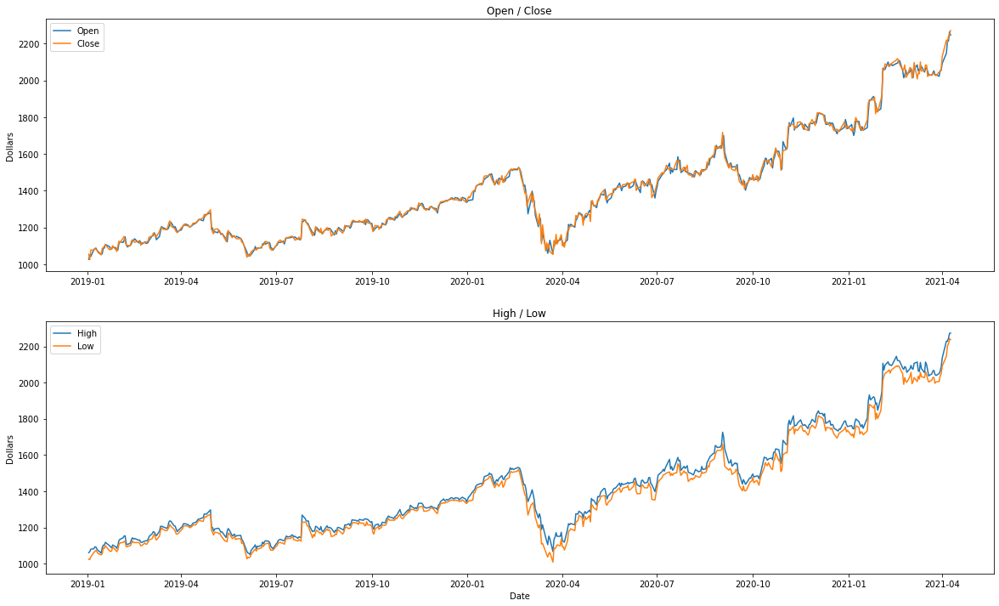

In [27]:
t = '2019-01-01'
plt.figure(figsize=(20,12))

plt.subplot(2,1,1)
plt.title('Open / Close')
plt.plot(df.loc[t:].index, 'Open', data=df.loc[t:])
plt.plot(df.loc[t:].index, 'Close', data=df.loc[t:])
plt.legend(loc='best')
plt.ylabel('Dollars')


plt.subplot(2,1,2)
plt.title('High / Low')
plt.plot(df.loc[t:].index, 'High', data=df.loc[t:])
plt.plot(df.loc[t:].index, 'Low', data=df.loc[t:])
plt.legend(loc='best')
plt.xlabel('Date')
plt.ylabel('Dollars')


In [28]:
# Plot the candlestick chart
figure = go.Figure(data=[go.Candlestick(x = df.loc[t:].index,
            low= df.loc[t:].Low,
            high=df.loc[t:].High,
            close=df.loc[t:].Close,
            open=df.loc[t:].Open,
            increasing_line_color='green',
            decreasing_line_color='red')])
figure.update_layout(title='GOOGL Candelstick Chart', yaxis_title='Price in $', xaxis_title='Date')

figure.show()

### Plot the gaps

Text(0, 0.5, '(Yearly)\n%')

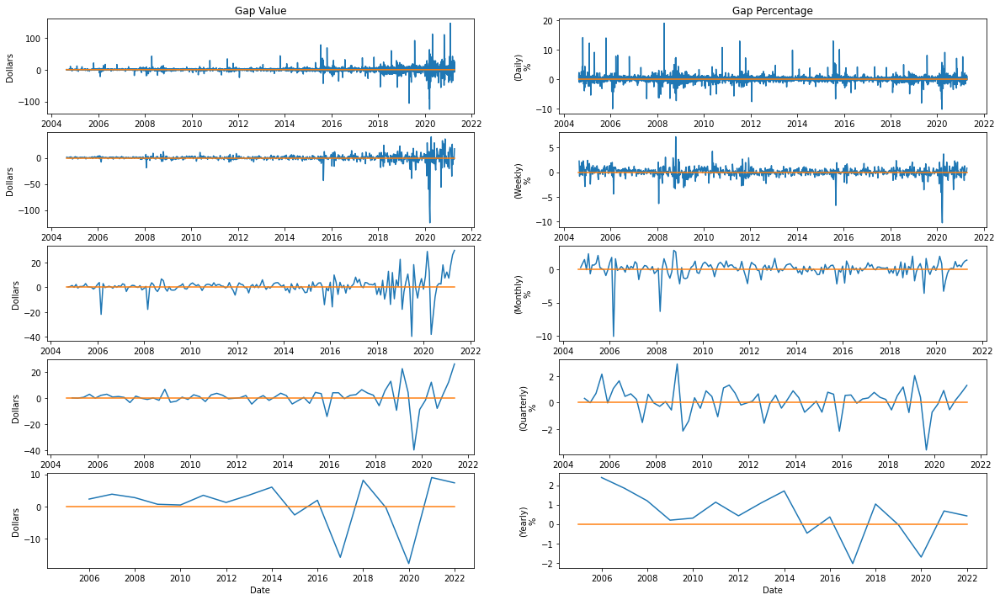

In [29]:
t = '2004-01-01'
plt.figure(figsize=(20,12))

plt.subplot(5,2,1)
plt.title('Gap Value')
sns.lineplot(x= df.gapValue.loc[t:].index, y= df.gapValue.loc[t:])
sns.lineplot(x = df.gapValue.loc[t:].index, y = 0)
plt.ylabel('Dollars')
plt.subplot(5,2,2)
plt.title('Gap Percentage')
sns.lineplot(x= df.gapPercentage.loc[t:].index, y= df.gapPercentage.loc[t:])
sns.lineplot(x = df.gapPercentage.loc[t:].index, y = 0)
plt.ylabel('(Daily)\n%')

plt.subplot(5,2,3)
sns.lineplot(x= dfWeekly.gapValue.loc[t:].index, y= dfWeekly.gapValue.loc[t:])
sns.lineplot(x = dfWeekly.gapValue.loc[t:].index, y = 0)
plt.ylabel('Dollars')
plt.subplot(5,2,4)
sns.lineplot(x= dfWeekly.gapPercentage.loc[t:].index, y= dfWeekly.gapPercentage.loc[t:])
sns.lineplot(x = dfWeekly.gapPercentage.loc[t:].index, y = 0)
plt.ylabel('(Weekly)\n%')

plt.subplot(5,2,5)
sns.lineplot(x= dfMonthly.gapValue.loc[t:].index, y= dfMonthly.gapValue.loc[t:])
sns.lineplot(x = dfMonthly.gapValue.loc[t:].index, y = 0)
plt.ylabel('Dollars')
plt.subplot(5,2,6)
sns.lineplot(x= dfMonthly.gapPercentage.loc[t:].index, y= dfMonthly.gapPercentage.loc[t:])
sns.lineplot(x = dfMonthly.gapPercentage.loc[t:].index, y = 0)
plt.ylabel('(Monthly)\n%')

plt.subplot(5,2,7)
sns.lineplot(x= dfQuarterly.gapValue.loc[t:].index, y= dfQuarterly.gapValue.loc[t:])
sns.lineplot(x = dfQuarterly.gapValue.loc[t:].index, y = 0)
plt.ylabel('Dollars')
plt.subplot(5,2,8)
sns.lineplot(x= dfQuarterly.gapPercentage.loc[t:].index, y= dfQuarterly.gapPercentage.loc[t:])
sns.lineplot(x = dfQuarterly.gapPercentage.loc[t:].index, y = 0)
plt.ylabel('(Quarterly)\n%')

plt.subplot(5,2,9)
sns.lineplot(x= dfYearly.gapValue.loc[t:].index, y= dfYearly.gapValue.loc[t:])
sns.lineplot(x = dfYearly.gapValue.loc[t:].index, y = 0)
plt.ylabel('Dollars')
plt.subplot(5,2,10)
sns.lineplot(x= dfYearly.gapPercentage.loc[t:].index, y= dfYearly.gapPercentage.loc[t:])
sns.lineplot(x = dfYearly.gapPercentage.loc[t:].index, y = 0)
plt.ylabel('(Yearly)\n%')

> We notice that it's better to look at the gaps based on percentage rather than the value

## Seasonality checking

In [30]:
# Making quarter periods for further use
quarterPeriods = pd.Series(pd.date_range("1/1/2004", freq="3M", periods=69))

### Quarterly charts for gap percentage

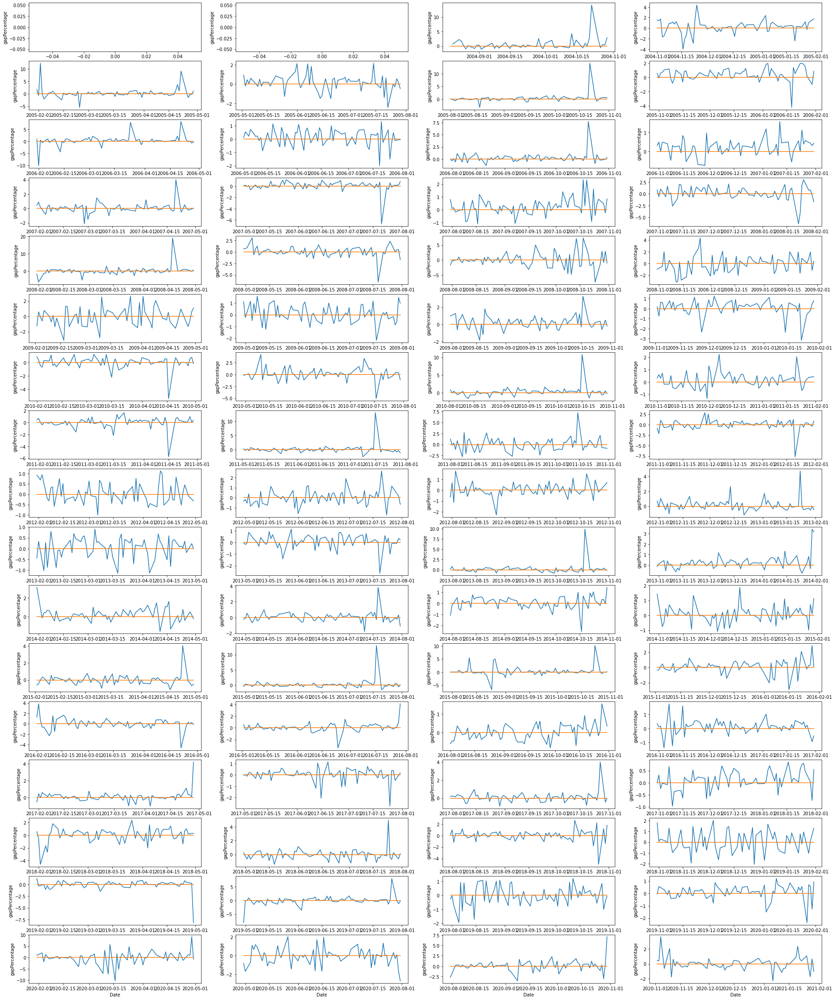

In [31]:
plt.figure(figsize=(32,43))

for i in range(17):
    for j in range(4):
        plt.subplot(18, 4, (4*i + (j+1)))
        sns.lineplot(x = df.gapPercentage.loc[quarterPeriods[(4*i + (j))]:quarterPeriods[(4*i + (j+1))]].index, y = df.gapPercentage.loc[quarterPeriods[(4*i + (j))]:quarterPeriods[(4*i + (j+1))]])
        sns.lineplot(x = df.gapPercentage.loc[quarterPeriods[(4*i + (j))]:quarterPeriods[(4*i + (j+1))]].index, y = 0)

> We notice at the end of the first three quarters of the year, mostly there is a huge gap. It usually refers to earning report of the company.

### Quarterly charts for volume

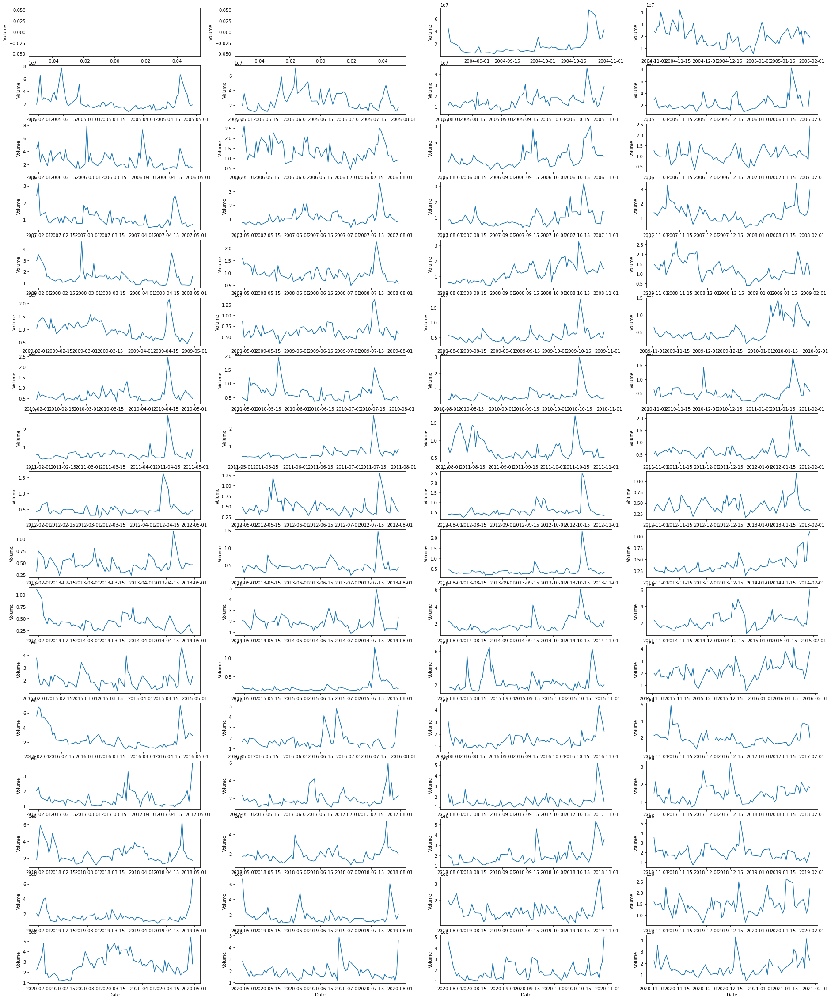

In [32]:
plt.figure(figsize=(32,43))

for i in range(17):
    for j in range(4):
        plt.subplot(18, 4, (4*i + (j+1)))
        sns.lineplot(x = df.Volume.loc[quarterPeriods[(4*i + (j))]:quarterPeriods[(4*i + (j+1))]].index, y = df.Volume.loc[quarterPeriods[(4*i + (j))]:quarterPeriods[(4*i + (j+1))]])

> We notice at the end of the first three quarters of the year and in the beginning of the year in 4th quarter, mostly there is a huge volume.

### Quarterly charts for original and whole fluctuations

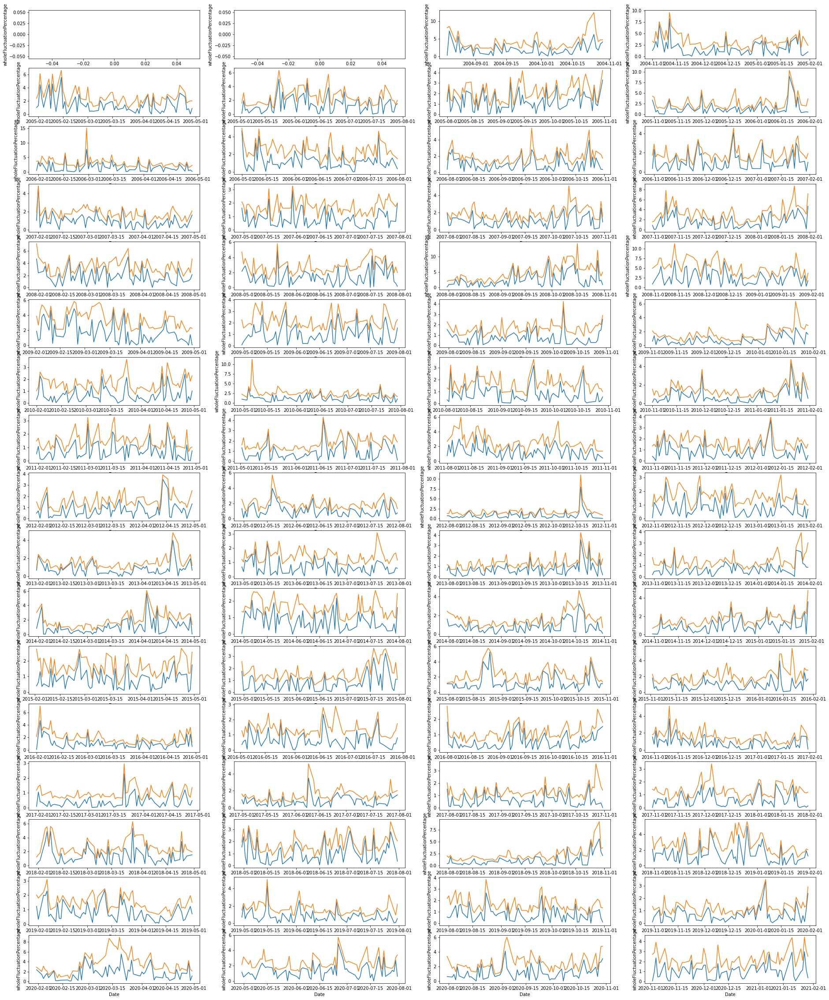

In [33]:
plt.figure(figsize=(32,43))

for i in range(17):
    for j in range(4):
        plt.subplot(18, 4, (4*i + (j+1)))
        sns.lineplot(x = df.originalFluctuationPercentage.loc[quarterPeriods[(4*i + (j))]:quarterPeriods[(4*i + (j+1))]].index, y = df.originalFluctuationPercentage.loc[quarterPeriods[(4*i + (j))]:quarterPeriods[(4*i + (j+1))]])
        sns.lineplot(x = df.wholeFluctuationPercentage.loc[quarterPeriods[(4*i + (j))]:quarterPeriods[(4*i + (j+1))]].index, y = df.wholeFluctuationPercentage.loc[quarterPeriods[(4*i + (j))]:quarterPeriods[(4*i + (j+1))]])

### Quarterly charts for shadow and whole fluctuations

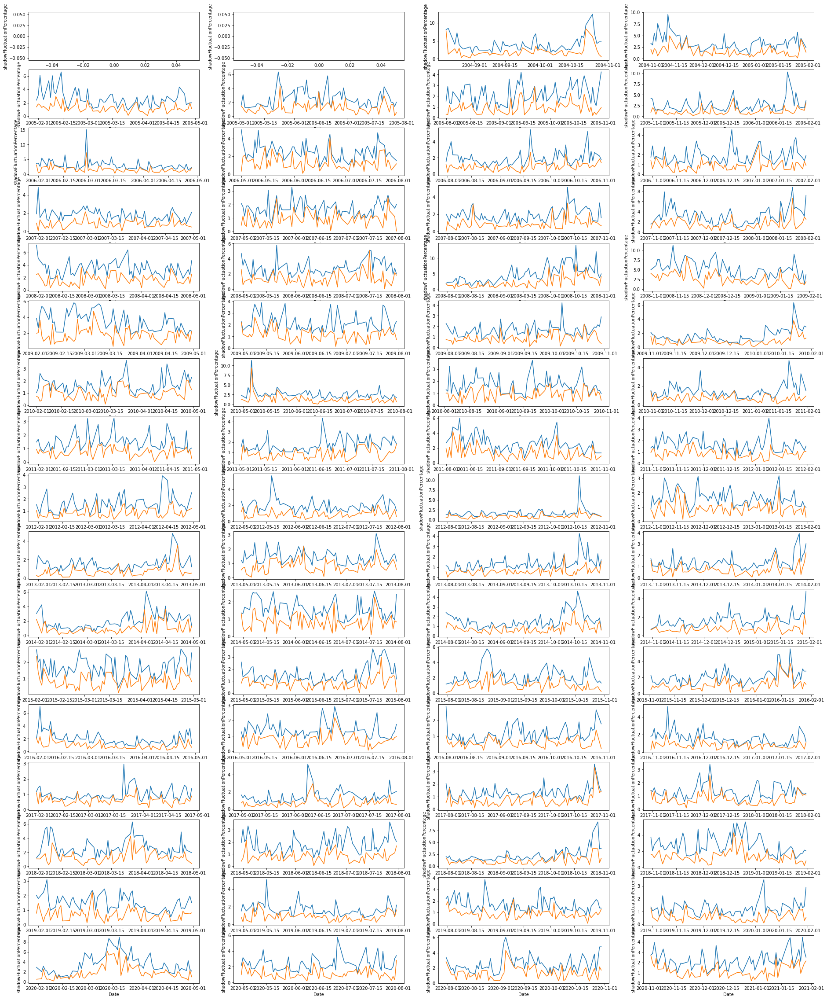

In [34]:
# Quarterly charts for shadow and whole fluctuations
quarterPeriods = pd.Series(pd.date_range("1/1/2004", freq="3M", periods=69))

plt.figure(figsize=(32,43))

for i in range(17):
    for j in range(4):
        plt.subplot(18, 4, (4*i + (j+1)))
        sns.lineplot(x = df.wholeFluctuationPercentage.loc[quarterPeriods[(4*i + (j))]:quarterPeriods[(4*i + (j+1))]].index, y = df.wholeFluctuationPercentage.loc[quarterPeriods[(4*i + (j))]:quarterPeriods[(4*i + (j+1))]])
        sns.lineplot(x = df.shadowFluctuationPercentage.loc[quarterPeriods[(4*i + (j))]:quarterPeriods[(4*i + (j+1))]].index, y = df.shadowFluctuationPercentage.loc[quarterPeriods[(4*i + (j))]:quarterPeriods[(4*i + (j+1))]])

> We can see there is a really good correlation between original and whole fluctuations and less noticeable correlation between shadow and whole fluctuations.

## Correlation

Find the correlation between features for Daily and Weekly DataFrames

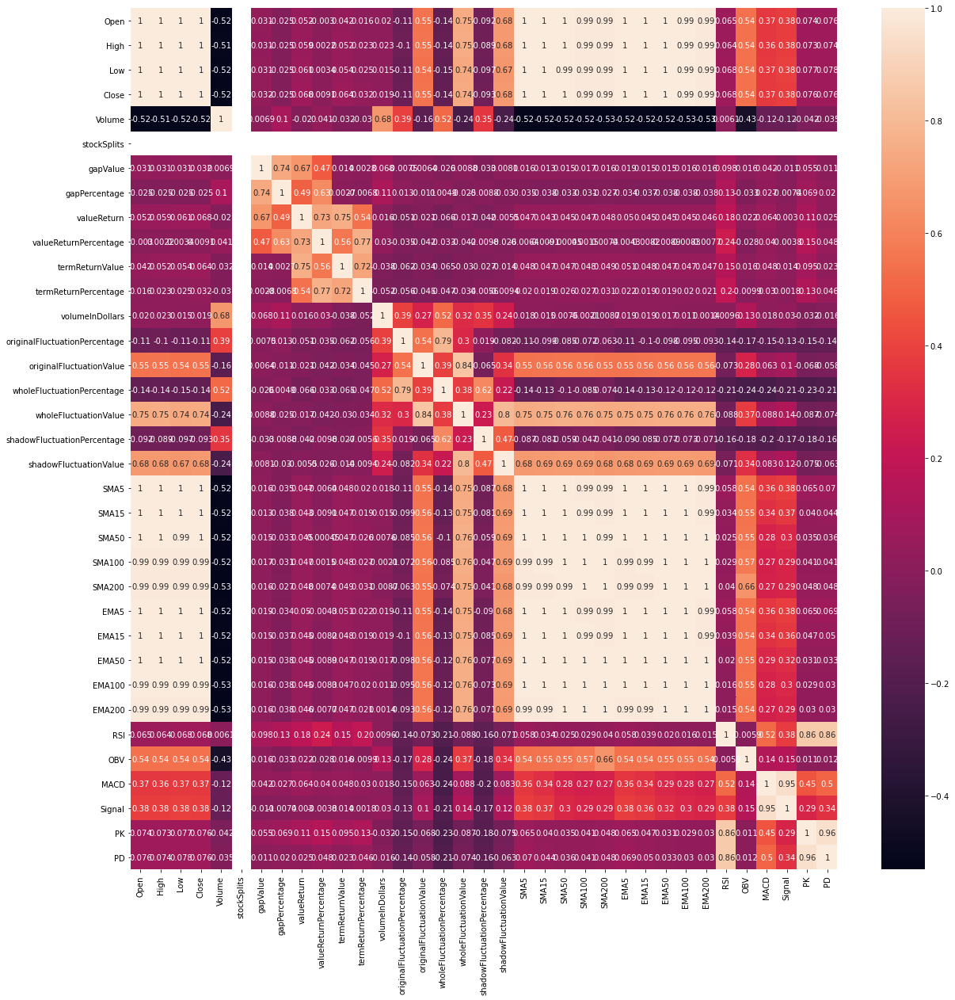

In [35]:
# Daily correlation
plt.figure(figsize=(20,20))
cor = df.corr()
sns.heatmap(cor, xticklabels=cor.columns, yticklabels=cor.columns, annot=True)

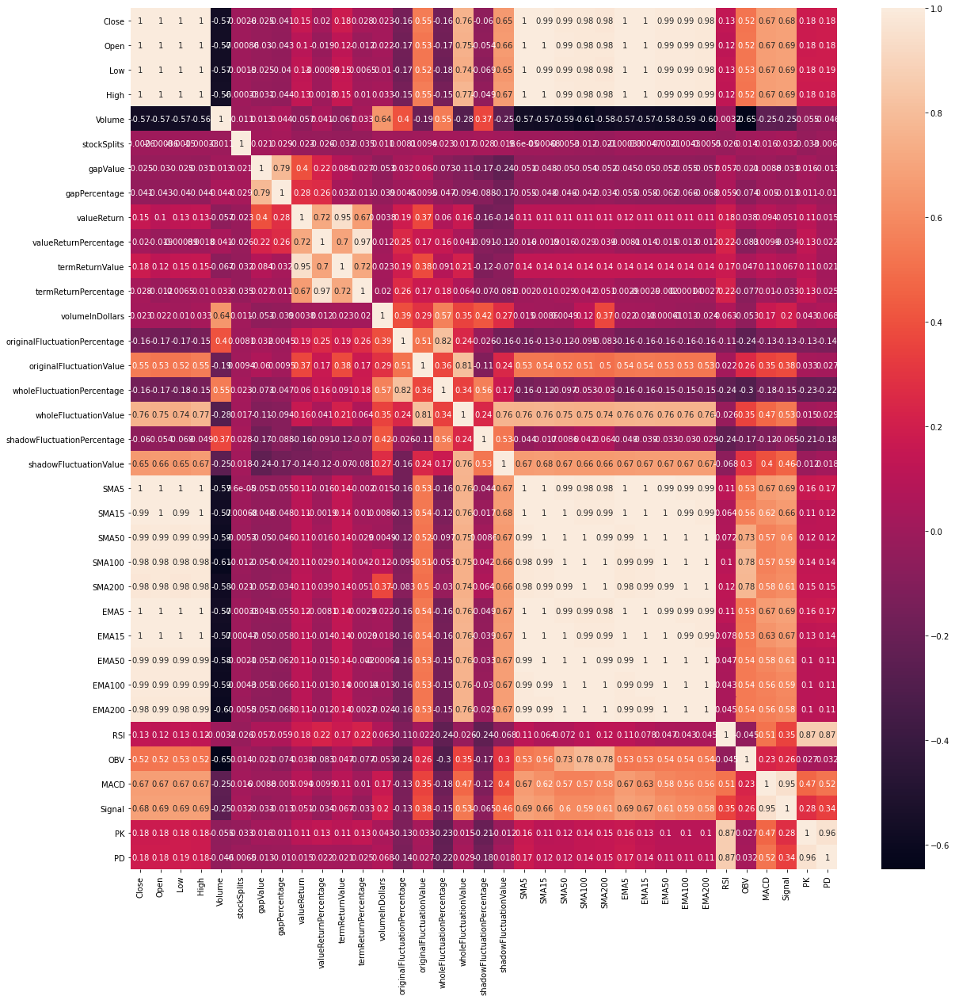

In [36]:
# Weekly correlation
plt.figure(figsize=(20,20))
cor = dfWeekly.corr()
sns.heatmap(cor, xticklabels=cor.columns, yticklabels=cor.columns, annot=True)

- We can see the earlier assumption about correlation between original and whole fluctuation is true!
- In weekly time frame, we can observe there is a high correlation between term return value and value return.

# Plotting indicators

In [37]:
# Making yearly periods for further use
yearPeriods = pd.Series(pd.date_range("1/1/2004", freq="Y", periods=17))

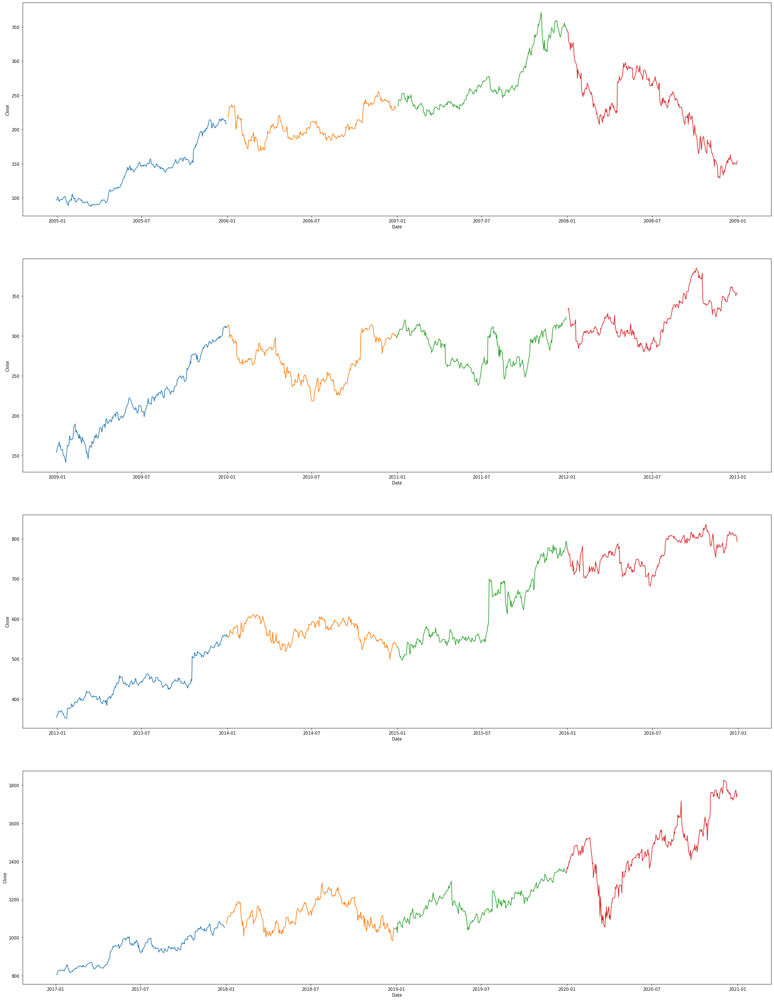

In [38]:
# Yearly charts for Close price
plt.figure(figsize=(32,43))

for i in range(4):
    plt.subplot(4, 1, i+1)
    sns.lineplot(x = df.Close.loc[yearPeriods[4*i]:yearPeriods[4*i + 1]].index, y = df.Close.loc[yearPeriods[4*i]:yearPeriods[4*i + 1]])
    sns.lineplot(x = df.Close.loc[yearPeriods[4*i + 1]:yearPeriods[4*i + 2]].index, y = df.Close.loc[yearPeriods[4*i + 1]:yearPeriods[4*i + 2]])
    sns.lineplot(x = df.Close.loc[yearPeriods[4*i + 2]:yearPeriods[4*i + 3]].index, y = df.Close.loc[yearPeriods[4*i + 2]:yearPeriods[4*i + 3]])
    sns.lineplot(x = df.Close.loc[yearPeriods[4*i + 3]:yearPeriods[4*i + 4]].index, y = df.Close.loc[yearPeriods[4*i + 3]:yearPeriods[4*i + 4]])

> If we look at blue charts (years 2005, 2009, 2013, 2017), there is a good hypothesis that these years are good for investing and there is a good return for that.

In [39]:
t = '2019-01-01' # Time variable to ease the plotting process

## SMA / EMA

Text(0, 0.5, 'Dollars')

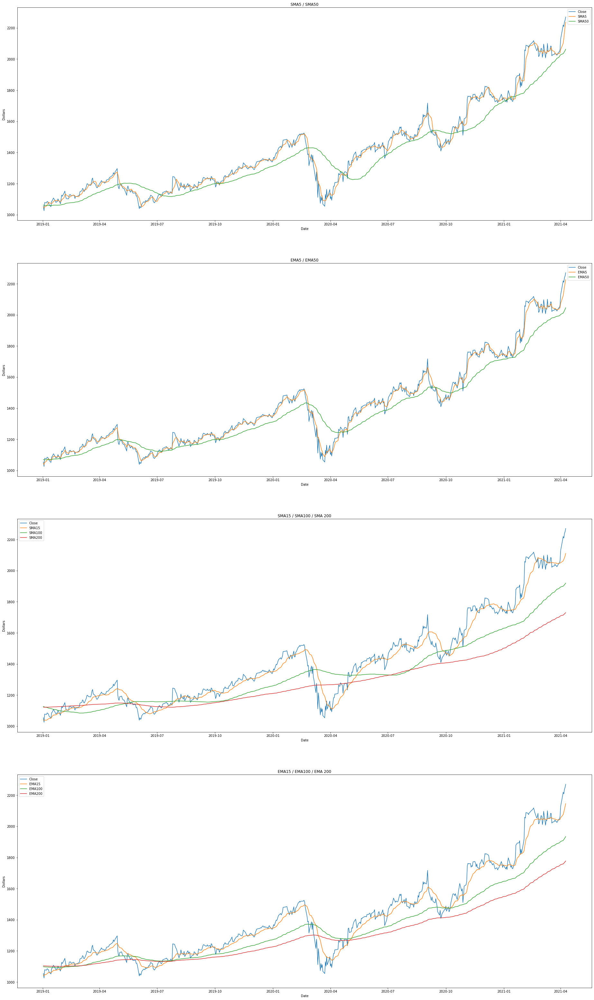

In [40]:
plt.figure(figsize=(32,56))

plt.subplot(4,1,1)
plt.title('SMA5 / SMA50')
plt.plot(df.loc[t:].index, 'Close', data=df.loc[t:])
plt.plot(df.loc[t:].index, 'SMA5', data=df.loc[t:])
plt.plot(df.loc[t:].index, 'SMA50', data=df.loc[t:])
plt.legend(loc='best')
plt.xlabel('Date')
plt.ylabel('Dollars')

plt.subplot(4,1,2)
plt.title('EMA5 / EMA50')
plt.plot(df.loc[t:].index, 'Close', data=df.loc[t:])
plt.plot(df.loc[t:].index, 'EMA5', data=df.loc[t:])
plt.plot(df.loc[t:].index, 'EMA50', data=df.loc[t:])
plt.legend(loc='best')
plt.xlabel('Date')
plt.ylabel('Dollars')

plt.subplot(4,1,3)
plt.title('SMA15 / SMA100 / SMA 200')
plt.plot(df.loc[t:].index, 'Close', data=df.loc[t:])
plt.plot(df.loc[t:].index, 'SMA15', data=df.loc[t:])
plt.plot(df.loc[t:].index, 'SMA100', data=df.loc[t:])
plt.plot(df.loc[t:].index, 'SMA200', data=df.loc[t:])
plt.legend(loc='best')
plt.xlabel('Date')
plt.ylabel('Dollars')

plt.subplot(4,1,4)
plt.title('EMA15 / EMA100 / EMA 200')
plt.plot(df.loc[t:].index, 'Close', data=df.loc[t:])
plt.plot(df.loc[t:].index, 'EMA15', data=df.loc[t:])
plt.plot(df.loc[t:].index, 'EMA100', data=df.loc[t:])
plt.plot(df.loc[t:].index, 'EMA200', data=df.loc[t:])
plt.legend(loc='best')
plt.xlabel('Date')
plt.ylabel('Dollars')

## MACD

Text(0, 0.5, 'Dollars')

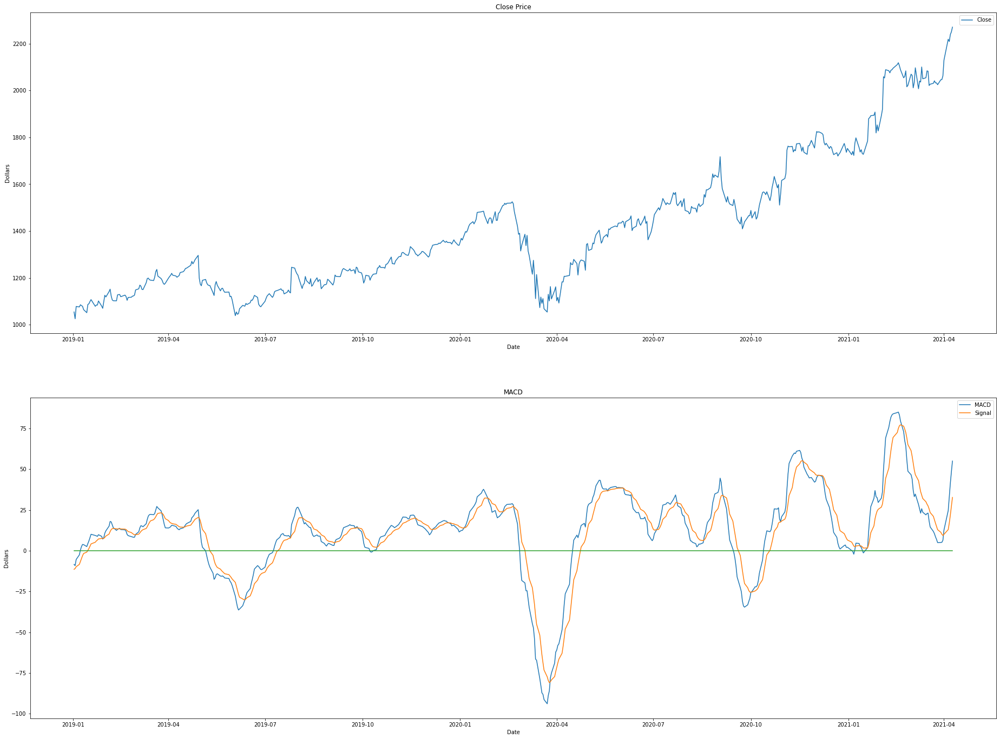

In [41]:
plt.figure(figsize=(32,24))

plt.subplot(2,1,1)
plt.title('Close Price')
plt.plot(df.loc[t:].index, 'Close', data=df.loc[t:])
plt.legend(loc='best')
plt.xlabel('Date')
plt.ylabel('Dollars')

plt.subplot(2,1,2)
plt.title('MACD')
sns.lineplot(data = df.loc[t:].MACD, label='MACD')
sns.lineplot(data = df.loc[t:].Signal, label='Signal')
sns.lineplot(x = df.loc[t:].index, y = 0) # Baseline
plt.legend(loc='best')
plt.xlabel('Date')
plt.ylabel('Dollars')

## RSI

Text(0, 0.5, 'Dollars')

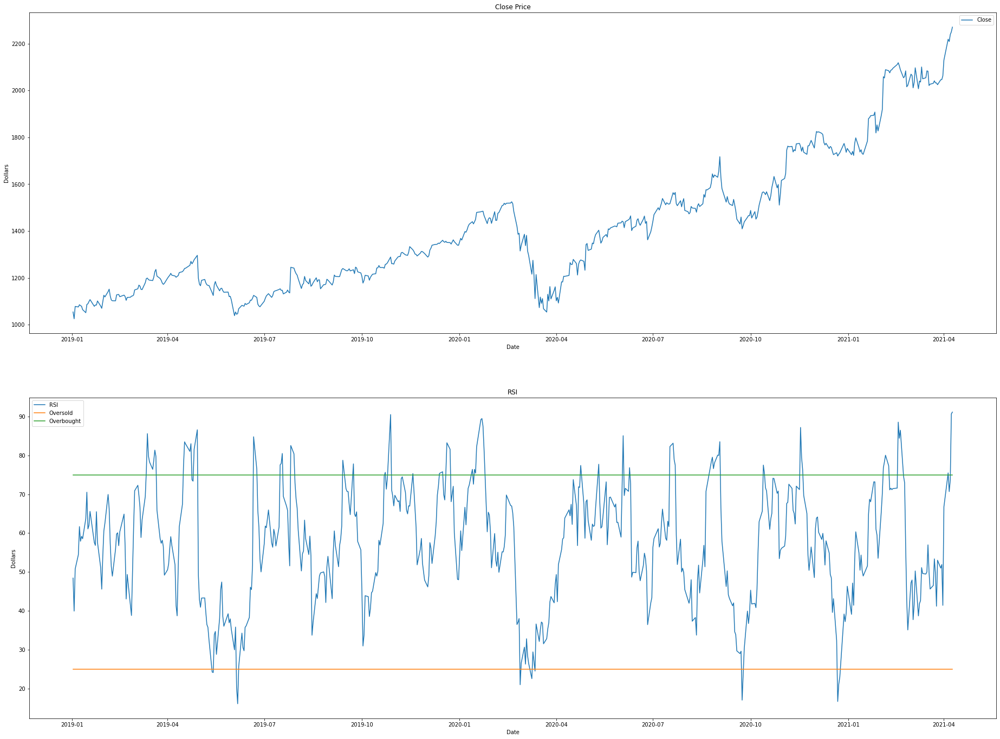

In [42]:
plt.figure(figsize=(32,24))

plt.subplot(2,1,1)
plt.title('Close Price')
plt.plot(df.loc[t:].index, 'Close', data=df.loc[t:])
plt.legend(loc='best')
plt.xlabel('Date')
plt.ylabel('Dollars')

plt.subplot(2,1,2)
plt.title('RSI')
sns.lineplot(data = df.loc[t:].RSI, label='RSI')
sns.lineplot(x = df.loc[t:].index, y = 25, label='Oversold') # Oversold level
sns.lineplot(x = df.loc[t:].index, y = 75, label='Overbought') # Overbought level
plt.legend(loc='best')
plt.xlabel('Date')
plt.ylabel('Dollars')

## Stochastic Oscillator

Text(0, 0.5, 'Dollars')

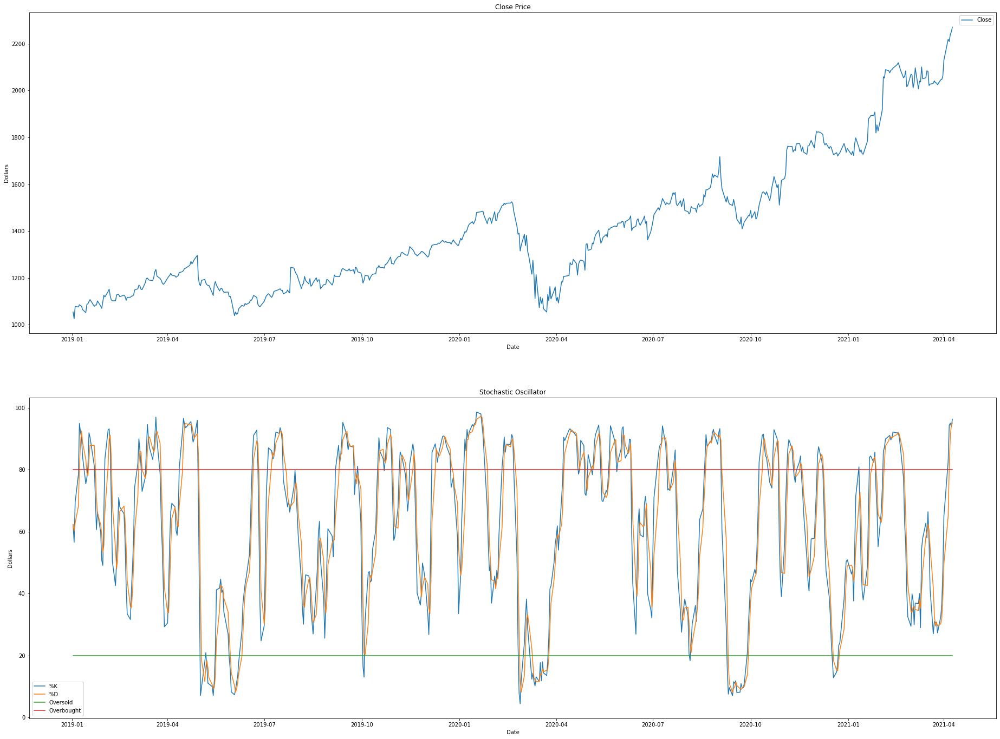

In [43]:
plt.figure(figsize=(32,24))

plt.subplot(2,1,1)
plt.title('Close Price')
plt.plot(df.loc[t:].index, 'Close', data=df.loc[t:])
plt.legend(loc='best')
plt.xlabel('Date')
plt.ylabel('Dollars')

plt.subplot(2,1,2)
plt.title('Stochastic Oscillator')
sns.lineplot(data = df.loc[t:].PK, label='%K')
sns.lineplot(data = df.loc[t:].PD, label='%D')
sns.lineplot(x = df.loc[t:].index, y = 20, label='Oversold') # Oversold level
sns.lineplot(x = df.loc[t:].index, y = 80, label='Overbought') # Overbought level
plt.legend(loc='best')
plt.xlabel('Date')
plt.ylabel('Dollars')

## OBV

Text(0, 0.5, 'Dollars')

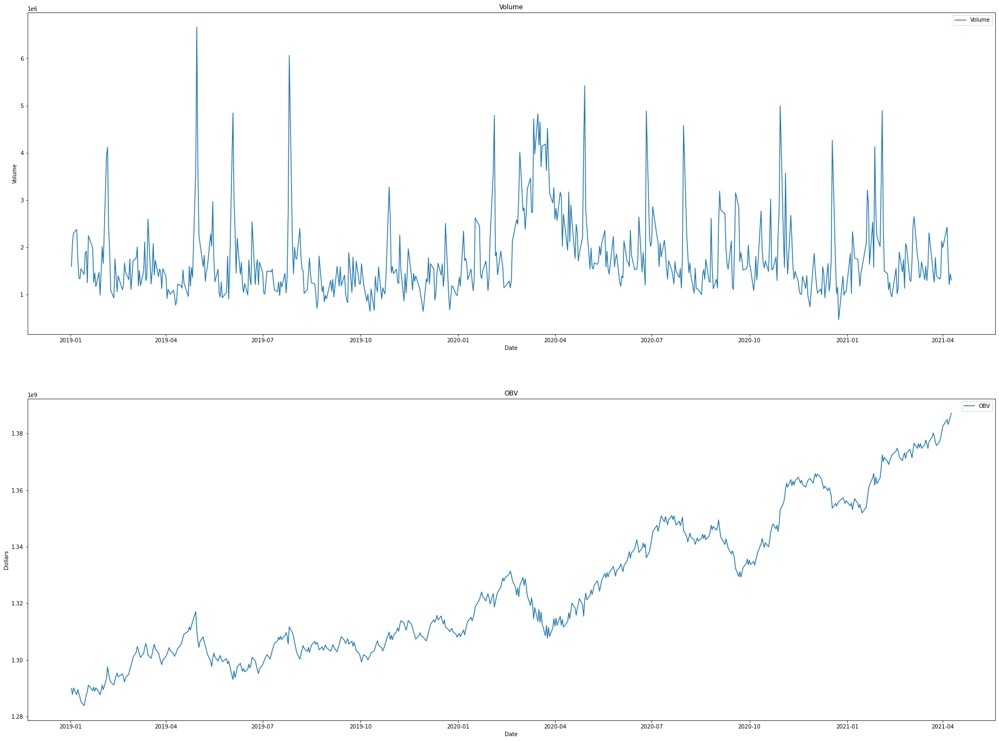

In [44]:
plt.figure(figsize=(32,24))

plt.subplot(2,1,1)
plt.title('Volume')
plt.plot(df.loc[t:].index, 'Volume', data=df.loc[t:])
plt.legend(loc='best')
plt.xlabel('Date')
plt.ylabel('Volume')

plt.subplot(2,1,2)
plt.title('OBV')
sns.lineplot(data = df.loc[t:].OBV, label='OBV')
plt.legend(loc='best')
plt.xlabel('Date')
plt.ylabel('Dollars')

## Plotting MACD / RSI / Stochastic Oscillator / OBV
Plot the indicators together for more intuition

Text(0, 0.5, 'Dollars')

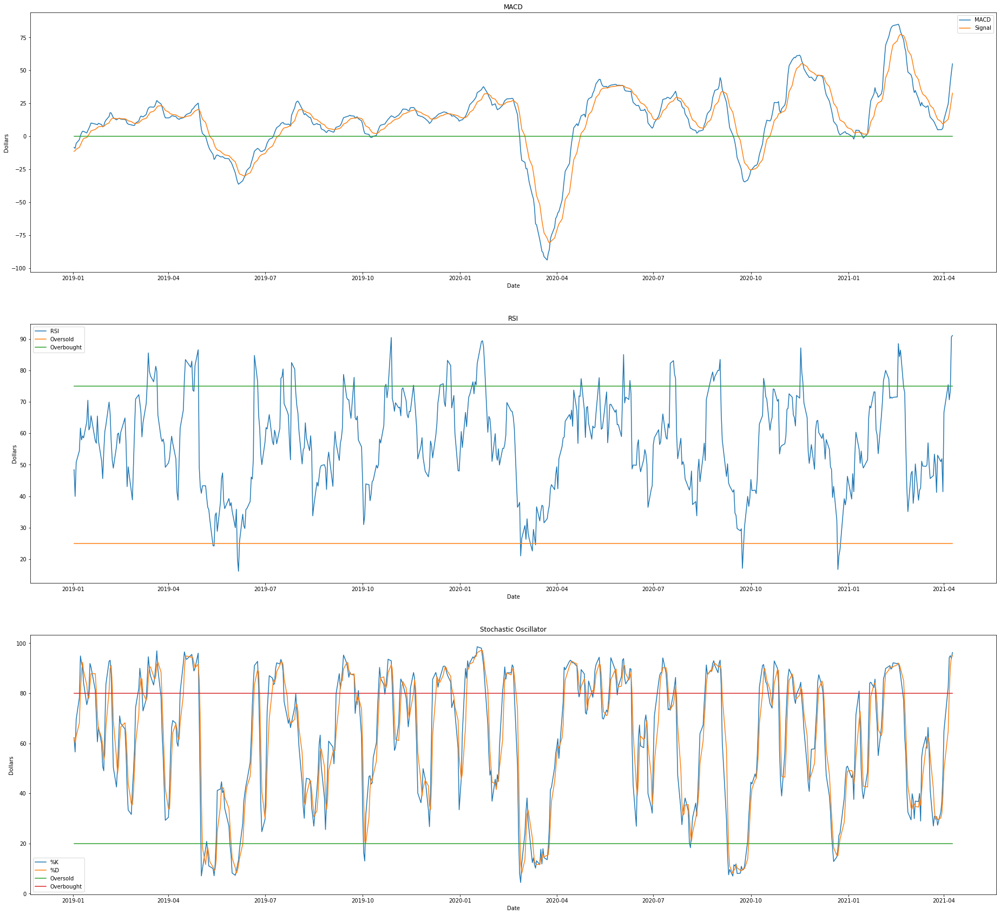

In [45]:
plt.figure(figsize=(32,30))

plt.subplot(3,1,1)
plt.title('MACD')
sns.lineplot(data = df.loc[t:].MACD, label='MACD')
sns.lineplot(data = df.loc[t:].Signal, label='Signal')
sns.lineplot(x = df.loc[t:].index, y = 0) # Baseline
plt.legend(loc='best')
plt.xlabel('Date')
plt.ylabel('Dollars')

plt.subplot(3,1,2)
plt.title('RSI')
sns.lineplot(data = df.loc[t:].RSI, label='RSI')
sns.lineplot(x = df.loc[t:].index, y = 25, label='Oversold') # Oversold level
sns.lineplot(x = df.loc[t:].index, y = 75, label='Overbought') # Overbought level
plt.legend(loc='best')
plt.xlabel('Date')
plt.ylabel('Dollars')

plt.subplot(3,1,3)
plt.title('Stochastic Oscillator')
sns.lineplot(data = df.loc[t:].PK, label='%K')
sns.lineplot(data = df.loc[t:].PD, label='%D')
sns.lineplot(x = df.loc[t:].index, y = 20, label='Oversold') # Oversold level
sns.lineplot(x = df.loc[t:].index, y = 80, label='Overbought') # Overbought level
plt.legend(loc='best')
plt.xlabel('Date')
plt.ylabel('Dollars')

# Building a Model


We're gonna split our DataFrame into two pieces:
- Before stock split
- After stock split

Then we can drop the stockSplit column

---
We're gonna use after stock split data for simplicity.

Also we're gonna leave 2021 data for test in the future.

## Random Forest Regressor

In [46]:
# Importing necessities
import sklearn
    # Data spliter
from sklearn.model_selection import TimeSeriesSplit
    # Metrics
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_percentage_error
    # Models
from sklearn.ensemble import RandomForestRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.svm import SVR

from fbprophet import Prophet

In [47]:
print(f'Scikit-learn version is: {sklearn.__version__}')

Scikit-learn version is: 0.24.1


### Creating desired vectors for ML libraries compatibility 

In [48]:
df['Pred'] = df.Open.shift(periods=-1)
dff = df.drop(['stockSplits'], axis=1)
dff.dropna(inplace=True)
start_pred_time = '2021-03-01'

# Making y and X for further usage in the model
y = dff.Pred.loc[split_date:start_pred_time]
y = y.reset_index()
y.drop(['Date'], axis=1, inplace=True)
X = dff.loc[split_date:start_pred_time]
X.reset_index(inplace=True)
X.drop(['Date', 'Pred'], axis=1, inplace=True)

# Make 2021 data as test data
y_test = dff.Pred.loc[start_pred_time:]
y_test.dropna(inplace=True)
y_test = y_test.reset_index()
y_test.drop(['Date'], axis=1, inplace=True)
X_test = dff.loc[start_pred_time:]
X_test.reset_index(inplace=True)
X_test.drop(['Date', 'Pred'], axis=1, inplace=True)


# Making the dataframe compatible with Prophet library
yProphet = df.Open.loc[split_date:start_pred_time]
yProphet = yProphet.reset_index()
yProphet.rename(columns={'Date':'ds', 'Open':'y'}, inplace=True)

/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:3990: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [49]:
# Using TimeSeriesSplit for split the data
tscv = TimeSeriesSplit(n_splits=100)
tscv

TimeSeriesSplit(gap=0, max_train_size=None, n_splits=100, test_size=None)

In [50]:
# Make a Random Forest model
model = RandomForestRegressor(random_state=0)
model

RandomForestRegressor(random_state=0)

In [51]:
# Use TimeSeriesSplit and the model for prediction
i = 0
for train_index, valid_index in tscv.split(X):
    # print("TRAIN:", train_index, "VALIDATION:", valid_index)
    X_train, X_val = X.loc[train_index], X.loc[valid_index]
    y_train, y_val = y.loc[train_index], y.loc[valid_index]
    model.fit(X_train, y_train.values.ravel())
    pred = model.predict(X_val)
    mae = mean_absolute_error(y_val, pred)
    mse = mean_squared_error(y_val, pred)
    mape = mean_absolute_percentage_error(y_val, pred)
    print(f'{i}:\n \tMAE is: {mae}\n \tMSE is: {mse}\n \tMAPE is: {mape}')
    prediction = model.predict(X_test)
    maeRF1 = mean_absolute_error(y_test, prediction)
    mseRF1 = mean_squared_error(y_test, prediction)
    mapeRF1 = mean_absolute_percentage_error(y_test, prediction)
    print(f'\n    Test:\n \tMAE is: {mae}\n \tMSE is: {mse}\n \tMAPE is: {mape}')
    i += 1

0:
 	MAE is: 6.602129411764355
 	MSE is: 61.65179863881825
 	MAPE is: 0.01181552555830782

    Test:
 	MAE is: 6.602129411764355
 	MSE is: 61.65179863881825
 	MAPE is: 0.01181552555830782
1:
 	MAE is: 15.488270588235409
 	MSE is: 297.882782894121
 	MAPE is: 0.026180123141265197

    Test:
 	MAE is: 15.488270588235409
 	MSE is: 297.882782894121
 	MAPE is: 0.026180123141265197
2:
 	MAE is: 4.396552941176424
 	MSE is: 30.501218748235246
 	MAPE is: 0.007453931326364483

    Test:
 	MAE is: 4.396552941176424
 	MSE is: 30.501218748235246
 	MAPE is: 0.007453931326364483
3:
 	MAE is: 2.7146058823530854
 	MSE is: 10.646290646471302
 	MAPE is: 0.004615495999267998

    Test:
 	MAE is: 2.7146058823530854
 	MSE is: 10.646290646471302
 	MAPE is: 0.004615495999267998
4:
 	MAE is: 3.460035294117454
 	MSE is: 17.447058163527622
 	MAPE is: 0.005872893339199827

    Test:
 	MAE is: 3.460035294117454
 	MSE is: 17.447058163527622
 	MAPE is: 0.005872893339199827
5:
 	MAE is: 5.07695882352946
 	MSE is: 40.8

In [52]:
# Make another Random Forest model
model2 = RandomForestRegressor(random_state=0)
model2.fit(X, y.values.ravel())

RandomForestRegressor(random_state=0)

In [53]:
# Make a prediction with second model without using TimeSeriesSplit
prediction2 = model2.predict(X_test)
maeRF2 = mean_absolute_error(y_test, prediction2)
mseRF2 = mean_squared_error(y_test, prediction2)
mapeRF2 = mean_absolute_percentage_error(y_test, prediction2)
print(f'\n    Test:\n \tMAE is: {mae}\n \tMSE is: {mse}\n \tMAPE is: {mape}')


    Test:
 	MAE is: 64.80675294117901
 	MSE is: 4894.685775527385
 	MAPE is: 0.03115200450471362


In [54]:
# Making the model and fit it
m = Prophet()
m.fit(yProphet)

# Make future date for predictions
future = m.make_future_dataframe(periods=35)

# Predict the future
forecast = m.predict(future)
forecast

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2014-04-03,592.724490,473.205152,631.889662,592.724490,592.724490,-42.025086,-42.025086,-42.025086,4.657072,4.657072,4.657072,-46.682158,-46.682158,-46.682158,0.0,0.0,0.0,550.699404
1,2014-04-04,592.487147,463.617302,627.089703,592.487147,592.487147,-40.405791,-40.405791,-40.405791,5.444684,5.444684,5.444684,-45.850475,-45.850475,-45.850475,0.0,0.0,0.0,552.081356
2,2014-04-07,591.775119,475.688195,626.934294,591.775119,591.775119,-40.622300,-40.622300,-40.622300,2.632855,2.632855,2.632855,-43.255155,-43.255155,-43.255155,0.0,0.0,0.0,551.152819
3,2014-04-08,591.537776,471.783356,629.082665,591.537776,591.537776,-38.675526,-38.675526,-38.675526,3.729461,3.729461,3.729461,-42.404987,-42.404987,-42.404987,0.0,0.0,0.0,552.862250
4,2014-04-09,591.300433,473.112466,637.815258,591.300433,591.300433,-36.934423,-36.934423,-36.934423,4.646037,4.646037,4.646037,-41.580460,-41.580460,-41.580460,0.0,0.0,0.0,554.366010
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1769,2021-04-01,1838.387764,1718.746091,1880.597139,1837.701594,1839.010590,-43.356136,-43.356136,-43.356136,4.657072,4.657072,4.657072,-48.013209,-48.013209,-48.013209,0.0,0.0,0.0,1795.031628
1770,2021-04-02,1839.600659,1724.450556,1875.679172,1838.871035,1840.300077,-41.831819,-41.831819,-41.831819,5.444684,5.444684,5.444684,-47.276503,-47.276503,-47.276503,0.0,0.0,0.0,1797.768840
1771,2021-04-03,1840.813554,1709.675791,1860.143412,1840.034150,1841.585325,-57.032878,-57.032878,-57.032878,-10.555054,-10.555054,-10.555054,-46.477824,-46.477824,-46.477824,0.0,0.0,0.0,1783.780676
1772,2021-04-04,1842.026449,1707.177174,1864.492655,1841.194594,1842.941389,-56.192607,-56.192607,-56.192607,-10.555054,-10.555054,-10.555054,-45.637552,-45.637552,-45.637552,0.0,0.0,0.0,1785.833843


In [55]:
q = forecast.shape[0] - y_test.shape[0]

# Error rate for yhat
maeProphety = mean_absolute_error(forecast.loc[q:].yhat, y_test)
mseProphety = mean_squared_error(forecast.loc[q:].yhat, y_test)
mapeProphety = mean_absolute_percentage_error(forecast.loc[q:].yhat, y_test)
print(f'yhat:\n\tMAE is: {mae}\n\tMSE is: {mse}\n\tMAPE is: {mape}')

# Error rate for yhat_upper
maeProphety_upper = mean_absolute_error(forecast.loc[q:].yhat_upper, y_test)
mseProphety_upper = mean_squared_error(forecast.loc[q:].yhat_upper, y_test)
mapeProphety_upper = mean_absolute_percentage_error(forecast.loc[q:].yhat_upper, y_test)
print(f'\n yhat_upper:\n\tMAE is: {mae}\n\tMSE is: {mse}\n\tMAPE is: {mape}')

yhat:
	MAE is: 64.80675294117901
	MSE is: 4894.685775527385
	MAPE is: 0.03115200450471362

 yhat_upper:
	MAE is: 64.80675294117901
	MSE is: 4894.685775527385
	MAPE is: 0.03115200450471362


# Comparing predictions of different models

In [56]:
# Create a DataFrame for comparing previous results
compare = pd.DataFrame()
compare['prophetMain'] = forecast.loc[q:].yhat
compare['prophetUpper'] = forecast.loc[q:].yhat_upper
compare.reset_index(inplace=True)
compare['Real_y'] = y_test
compare.drop(['index'], axis=1, inplace=True)
compare['RandomForest'] = prediction
compare['RandomForest2'] = prediction2
compare.head()

,prophetMain,prophetUpper,Real_y,RandomForest,RandomForest2
0,1806.923288,1886.647556,2064.84,1996.0837,2061.2962
1,1804.763059,1882.760227,2051.95,2002.2208,2058.6836
2,1801.807458,1883.999048,2014.87,1996.6301,2041.1395
3,1799.772553,1877.549206,2061.15,1994.6425,2054.7000
4,1781.126208,1862.085618,2084.06,1998.4285,2060.2752


In [57]:
md(f'''
## Comparing the error rates:

- Random Forest 1:
    - MAE is: {maeRF1}
    - MSE is: {mseRF1}
    - MAPE is: {mapeRF1}
- Random Forest 2:
    - MAE is: {maeRF2}
    - MSE is: {mseRF2}
    - MAPE is: {mapeRF2}
- Prophet, yhat:
    - MAE is: {maeProphety}
    - MSE is: {mseProphety}
    - MAPE is: {mapeProphety}
- Prophet, yhat_upper:
    - MAE is: {maeProphety_upper}
    - MSE is: {mseProphety_upper}
    - MAPE is: {mapeProphety_upper}
''')


## Comparing the error rates:

- Random Forest 1:
    - MAE is: 84.44676071428833
    - MSE is: 11441.716161110784
    - MAPE is: 0.03964992901742137
- Random Forest 2:
    - MAE is: 35.49152142857156
    - MSE is: 3831.04680437646
    - MAPE is: 0.01637524309412249
- Prophet, yhat:
    - MAE is: 293.2274792931097
    - MSE is: 90317.34739411037
    - MAPE is: 0.16401936494138702
- Prophet, yhat_upper:
    - MAE is: 213.24737701892255
    - MSE is: 49884.111890515785
    - MAPE is: 0.114179590991488


We can see the Random Forest 2 (model2) has the better performance.

# Predicting Tomorrow

In [58]:
# Random Forest
    # Making y and X for further usage in the model
yTomorrowRF = dff.Pred.loc[split_date:]
yTomorrowRF = yTomorrowRF.reset_index()
yTomorrowRF.drop(['Date'], axis=1, inplace=True)
XTomorrowRF = dff.loc[split_date:]
XTomorrowRF.reset_index(inplace=True)
XTomorrowRF.drop(['Date', 'Pred'], axis=1, inplace=True)
    # Make today data as test data
XTomorrowRF_test = df.tail(1).reset_index()
XTomorrowRF_test.drop(['Date', 'Pred', 'stockSplits'], axis=1, inplace=True)
    # Making the model and fit it
tomorrowModelRF = RandomForestRegressor(random_state=0)
tomorrowModelRF.fit(XTomorrowRF, yTomorrowRF.values.ravel())
    # Predict tomorrow
tomorrowPredictionRF = tomorrowModelRF.predict(XTomorrowRF_test)



# Prophet library
    # Making the dataframe compatible with Prophet library
yProTomorrow = df.Open.loc[split_date:]
yProTomorrow = yProTomorrow.reset_index()
yProTomorrow.rename(columns={'Date':'ds', 'Open':'y'}, inplace=True)
    # Making the model and fit it
tomorrowModel = Prophet()
tomorrowModel.fit(yProTomorrow)
    # Make tomorrow for predictions
tomorrowDate = tomorrowModel.make_future_dataframe(periods=1)
    # Predict tomorrow
tomorrowPrediction = tomorrowModel.predict(tomorrowDate)

/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:3990: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [59]:
tomorrowPrediction[['yhat', 'yhat_upper']].tail(1)

,yhat,yhat_upper
1767,1899.174678,1985.171945


In [60]:
tomorrowPredictionRF

array([2238.8167])